## Import Required Libraries

In [4]:
import numpy as np
from scipy.integrate import odeint
from scipy.signal import butter, filtfilt, find_peaks
from scipy.stats import gaussian_kde,ecdf,t,chi2
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline
from scipy.optimize import fsolve, minimize
import time
import pandas as pd
import os
import matplotlib.font_manager
from matplotlib.colors import ListedColormap
from matplotlib.ticker import FormatStrFormatter



## Tensor Solver Function

In [5]:
def solveForTensor(I_initial, I_x, I_y, I_z, thetad):
    # Define known values
    theta = np.deg2rad(thetad)
    I_xx = I_initial[0]
    I_yy = I_initial[1] 
    I_zz = I_initial[2] 
    I_xx_x = I_x[0] 
    I_yy_x = I_x[1] 
    I_zz_x = I_x[2] 
    I_xx_y = I_y[0] 
    I_yy_y = I_y[1] 
    I_zz_y = I_y[2] 
    I_xx_z = I_z[0]
    I_yy_z = I_z[1]
    I_zz_z = I_z[2] 

    # Construct rotation matrix
    R_x = np.array([[1, 0, 0],
                    [0, np.cos(theta[0]), np.sin(theta[0])],
                    [0, -np.sin(theta[0]), np.cos(theta[0])]])
    R_y = np.array([[np.cos(theta[1]), 0, -np.sin(theta[1])],
                    [0, 1, 0],
                    [np.sin(theta[1]), 0, np.cos(theta[1])]])
    R_z = np.array([[np.cos(theta[2]), np.sin(theta[2]), 0],
                    [-np.sin(theta[2]),np.cos(theta[2]),0],
                    [0,0,1]])

    # Define a function to minimize
    def objective(x):
        # initial guess
        I_xy, I_xz, I_yz = x

        # Initial tensor with guessed product moments
        I = np.array([[I_xx, I_xy, I_xz],
                    [I_xy, I_yy, I_yz],
                    [I_xz, I_yz, I_zz]])

        # Results after x,y,z rotations
        result_x = np.matmul(R_x, np.matmul(I, np.transpose(R_x)))
        # print('\nRotated Principals x')
        # print((result_x))
        result_y = np.matmul(R_y, np.matmul(I, np.transpose(R_y)))
        # print('\nRotated Principals y')
        # print((result_x))
        result_z = np.matmul(R_z, np.matmul(I, np.transpose(R_z)))
        # print('\nRotated Principals z')
        print((result_x))

        # Errors on Moments 
        error_x = np.sum(np.power(np.subtract(np.diag(result_x),np.matrix([I_xx_x,I_yy_x,I_zz_x])),2))
        error_y = np.sum(np.power(np.subtract(np.diag(result_y),np.matrix([I_xx_y,I_yy_y,I_zz_y])),2))
        error_z = np.sum(np.power(np.subtract(np.diag(result_z),np.matrix([I_xx_z,I_yy_z,I_zz_z])),2))

        error_net = error_x + error_y + error_z
        # print(error_net)
        # print('\n\n')
        return error_net

    # Initial guess for unknowns
    x0 = [0.1,0.1,0.1]  # Example initial guess, replace with your estimate

    # Minimize the objective function
    res = minimize(objective, x0)

    # Extract the optimized values
    I_xy_opt, I_xz_opt, I_yz_opt = res.x

    I_sovled = np.matrix([[I_xx,I_xy_opt,I_xz_opt],[I_xy_opt,I_yy,I_yz_opt],[I_xz_opt,I_yz_opt,I_zz]])

    return I_sovled

## Polynomial Fit Function

In [6]:
# Polynomial Regression Funciton used for minimizing error, requires calibrating against known inertias to get coefficients
# Use Calibration script to get this
def polyFit(x,a1,a2,a3):
    return a1*x**2 + a2*x + a3

## Viscous_Parameters_Solver Function

In [7]:
def viscous_parameters_solver(t, theta,mobject):
    l = 0.66
    r = 0.36115625
    g = 9.7949
    mnet = 3.35+mobject #FIRST NUMBER IS DISK AND SENSOR, NOT INCLUDING TRANSMITTER
    noise_param = 0.04

    # Trim NaN values from t and theta
    validIndicies = ~np.isnan(theta)
    t = t[validIndicies]
    theta = theta[validIndicies]

    # Filter the data
    b, a = butter(3, 0.05, 'low')
    filtered_theta = filtfilt(b, a, theta)
    
    peak_filtering_param = 3 #remember to adjust as to remove outliers associated with signal noise

    # Use find_peaks with adjusted parameters to identify peaks
    peaks, _ = find_peaks(filtered_theta, prominence=np.deg2rad(noise_param*peak_filtering_param))  # adjust prominence if needed

    # Check if peaks are found
    if len(peaks) == 0:
        print("No peaks were found.")
        return [0, 0, 0, 0]

    # Calculate the periods between peaks
    periods = np.diff(t[peaks])
    # plt.figure()
    # plt.plot(t,theta,'kx',ms=1)
    # plt.plot(t,filtered_theta,'r-')
    # plt.xlim((0,15))
    # plt.show()
    # plt.figure()
    # plt.plot(periods)
    # plt.show()
    # Calculate median filtered period
    T_d = np.median(periods)
    # print(f"T_d = {T_d}", end='\n')
    omega_d = (2 * np.pi) / T_d
    # print(f"Calculated wd = {omega_d}", end='\n')

    # Calculate the damping ratio
    amplitude_ratios = filtered_theta[peaks][1:] / filtered_theta[peaks][:-1]
    damping_ratios = -1*np.log(amplitude_ratios)
    # print(f"Calculated dr = {np.median(damping_ratios)}",end='\n')
    zeta = np.median(damping_ratios) / ( np.sqrt( (4 * np.pi ** 2) + (np.median(damping_ratios) ** 2) ) )
    # print(f"Calculated zeta = {zeta}",end='\n')

    # Calculate natural frequency and inertia
    omega_n = omega_d / np.sqrt(1 - zeta ** 2)
    Inet_pure = (mnet * g * r ** 2) / (l * omega_n ** 2)
    c_pure = zeta * 2 * np.sqrt(Inet_pure * ((mnet * g * r ** 2) / l))

    return [Inet_pure, (mnet * g * r ** 2) / l, c_pure, 0] # CURRENTLY RETURNING KG*CM2 NOT KG*M2


## Importing Data and Solving for Inertias Measured

#### Defining Important Variables

In [8]:
# Misc
folder_path = '/home/coder/workspace/Finnamore/Tensor Solver Files'
numTests = 43
df_disk_data = {}
disk_inertia_data = np.zeros(numTests)
disk_period_data = np.zeros(numTests)

# Coefficients for polynomial error correction: from calibration tests
a1 = 0.010220709817550407
a2 = 0.9012122694085278
a3 = 0.0015445940276830846

# defining filenames
disk_inertia = 0
date = '04.08.24'
heli_number = '1'
angle = '30'
theta = [30,30,30]
I_names = ['_x_n_00','_y_n_00','_z_n_00',
           '_x_y_'+angle,'_y_x_'+angle,'_z_x_'+angle,
           '_x_z_'+angle,'_y_z_'+angle,'_z_y_'+angle]

dateList = ['04.09.24','04.09.24','04.09.24','04.17.24','04.17.24','04.17.24','04.17.24','04.17.24','04.08.24']
count = 0
for name in I_names:
    I_names[count] = dateList[count] + name
    count = count+1

# defining distances between heli cg and total cg, frame cg and total cg, masses of each test
# Same order as I_names
dist_h = np.array([0.0311,0.1418,0.1385,0.2003,0.1497,0.1462,0.1878,0.2605,0.0135]) # Distance between Heli CG and Total CG
dist_f = np.array([0.0140,0.0823,0.0812,0.0295,0.0725,0.0719,0.0242,0.0349,0.0143]) # Distance between Frame CG and Total CG
mass_h = np.array([1.6485,1.6485,1.6485,1.6485,1.6485,1.6485,1.6485,1.6485,1.6485]) 
mass_f = np.array([2.8169,2.8169,2.8169,8.1713,3.2420,3.2420,8.1713,8.1713,8.1713])
mass_t = mass_f+mass_h
cg_distances_heli = {}
cg_distances_frame = {} 
mass_heli = {}
mass_frame = {}
mass_total = {}

for i in range(len(I_names)):
    cg_distances_heli[I_names[i]] = dist_h[i]
    cg_distances_frame[I_names[i]] = dist_f[i]
    mass_heli[I_names[i]] = mass_h[i]
    mass_frame[I_names[i]] = mass_f[i]
    mass_total[I_names[i]] = mass_t[i]



#### Importing Disk Value

In [9]:
# Importing and Calculating Disk Inertial Data
for i in range(numTests):
    # File Path Creation
    file_name = 'I_D_'+date+'_{:02}.csv'.format(i)
    file_path = os.path.join(folder_path,file_name)

    #Reading in Data
    df = pd.read_csv(file_path,usecols=[0,1])
    df_disk_data[i] = df.values

    #Solving for Disk Inertia
    
    disk_inertia_data[i] = viscous_parameters_solver(df_disk_data[i][:,0],df_disk_data[i][:,1],0)[0]

#Setting up Dicitonary of Known Inertial Values
disk_inertia = np.median(disk_inertia_data)
print(disk_inertia)

0.23182304371998363


#### Importing Heli Data, Solving for actual inertias being measured

In [10]:
raw_data_heli = {}
raw_data_frame = {}
inertia_data = {}
average_inertias = {}
# Define the pattern or names of your CSV files
for name in I_names:
    raw_data_heli[name] = {}
    raw_data_frame[name] = {}
    inertia_data[name] = np.zeros(numTests)
    for i in range(numTests):
        # Solving for raw 'inertia measured'
        heli_name = ('I_h'+heli_number+'_{}_{:02}.csv'.format(name,i))
        frame_name = ('I_f_{}_{:02}.csv'.format(name,i))
        heli_path = os.path.join(folder_path, heli_name)
        frame_path = os.path.join(folder_path,frame_name)
        df_heli = pd.read_csv(heli_path, usecols=[0, 1])
        df_frame = pd.read_csv(frame_path, usecols=[0, 1])
        raw_data_heli[name][i] = df_heli.values
        raw_data_frame[name][i] = df_frame.values
        total_i = viscous_parameters_solver(raw_data_heli[name][i][:,0],raw_data_heli[name][i][:,1],mass_total[name])[0] - disk_inertia
        frame_i = viscous_parameters_solver(raw_data_frame[name][i][:,0],raw_data_frame[name][i][:,1],mass_total[name]-mass_heli[name])[0] - disk_inertia

        # Solving for actual 'Heli about this axis, through the cg, inertia'
        # Using the paralell axis theorem
        heli_inertia = total_i-frame_i-(mass_frame[name]*cg_distances_frame[name]**2)-(mass_heli[name]*cg_distances_heli[name]**2)

        # Error correction using polynomial fit from calibration
        inertia_data[name][i] = polyFit(heli_inertia,a1,a2,a3)*10000
        
    # filtering NaN Values
    validIndexes = ~np.isnan(inertia_data[name])
    inertia_data[name] = inertia_data[name][validIndexes]
    average_inertias[name] = np.mean(inertia_data[name][:])


/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: invalid value encountered in log
  damping_ratios = -1*np.log(amplitude_ratios)
/tmp/ipykernel_22054/1183247787.py:45: RuntimeWarning: 

## Solving for Tensors

#### Solving for Tensor

In [11]:
I_principal = np.array([average_inertias['04.09.24_x_n_00'],average_inertias['04.09.24_y_n_00'],average_inertias['04.09.24_z_n_00']])
I_x = np.array([average_inertias['04.09.24_x_n_00'],average_inertias['04.17.24_y_x_30'],average_inertias['04.17.24_z_x_30']])
I_y = np.array([average_inertias['04.17.24_x_y_30'],average_inertias['04.09.24_y_n_00'],average_inertias['04.08.24_z_y_30']])
I_z = np.array([average_inertias['04.17.24_x_z_30'],average_inertias['04.17.24_y_z_30'],average_inertias['04.09.24_z_n_00']])
I_solved = solveForTensor(I_principal,I_x,I_y,I_z,theta)


[[ 7.07709676e+01  1.36602540e-01  3.66025404e-02]
 [ 1.36602540e-01  4.56427586e+02 -2.64236923e+00]
 [ 3.66025404e-02 -2.64236923e+00  4.53145501e+02]]
[[ 7.07709676e+01  1.36602553e-01  3.66025329e-02]
 [ 1.36602553e-01  4.56427586e+02 -2.64236923e+00]
 [ 3.66025329e-02 -2.64236923e+00  4.53145501e+02]]
[[ 7.07709676e+01  1.36602548e-01  3.66025533e-02]
 [ 1.36602548e-01  4.56427586e+02 -2.64236923e+00]
 [ 3.66025533e-02 -2.64236923e+00  4.53145501e+02]]
[[ 7.07709676e+01  1.36602540e-01  3.66025404e-02]
 [ 1.36602540e-01  4.56427586e+02 -2.64236922e+00]
 [ 3.66025404e-02 -2.64236922e+00  4.53145501e+02]]
[[ 70.77096763  -0.58547985  -0.63782442]
 [ -0.58547985 456.246247    -2.74706556]
 [ -0.63782442  -2.74706556 453.32684045]]
[[ 70.77096763  -0.58547984  -0.63782443]
 [ -0.58547984 456.246247    -2.74706556]
 [ -0.63782443  -2.74706556 453.32684045]]
[[ 70.77096763  -0.58547985  -0.63782441]
 [ -0.58547985 456.246247    -2.74706556]
 [ -0.63782441  -2.74706556 453.32684045]]
[[ 

#### Simulation for Error Bounds

##### Simulating Pops to Draw From

In [12]:
# Constructing fake "distributions" to sample from

numSimulatedTrials = 10000
simulatedPops = {}
for name in I_names:
    simulatedPops[name] = np.array([])
    sample_mean = np.mean(inertia_data[name][:])
    sample_std = np.std(inertia_data[name][:])
    sample_size = numTests
    se = sample_std/np.sqrt(sample_size)
    df = sample_size - 1
    t_value = t.ppf(0.975, df)  # 0.975 for a two-tailed test
    margin_of_error = t_value * se
    mean_std = margin_of_error/1.96 # Assuming a standard normal deviation the 95% error bound is at +- 1.96 std
    # Calculate the chi-square statistic for the upper and lower bounds of the confidence interval for the population standard deviation
    chi2_lower = chi2.ppf(0.025, df)
    chi2_upper = chi2.ppf(0.975, df)
    # Calculate the confidence interval for the population standard deviation
    std_std = (-1*np.sqrt((df * sample_std**2) / chi2_upper) + np.sqrt((df * sample_std**2) / chi2_lower))/4
    for trial in range(numSimulatedTrials):
        sample_mean_simulated = np.random.normal(sample_mean,mean_std,1)
        sample_std_simulated = np.random.normal(sample_std,std_std,1)
        sample_simulated = np.random.normal(sample_mean_simulated,sample_std_simulated,numTests)
        simulatedPops[name] = np.concatenate((simulatedPops[name],sample_simulated))


##### Drawing from Simulated Pops, Putting in TensorSolver

In [13]:
numSimulationsTensor = 1000
I_solved_simulated = np.zeros((3,3,numSimulationsTensor))
for i in range(numSimulationsTensor):
    indicies = np.random.randint(numSimulatedTrials,size=12)
    I_principal = np.array([simulatedPops['04.09.24_x_n_00'][indicies[0]],simulatedPops['04.09.24_y_n_00'][indicies[1]],simulatedPops['04.09.24_z_n_00'][indicies[2]]])
    I_x =         np.array([simulatedPops['04.09.24_x_n_00'][indicies[3]],simulatedPops['04.17.24_y_x_30'][indicies[4]],simulatedPops['04.17.24_z_x_30'][indicies[5]]])
    I_y =         np.array([simulatedPops['04.17.24_x_y_30'][indicies[6]],simulatedPops['04.09.24_y_n_00'][indicies[7]],simulatedPops['04.08.24_z_y_30'][indicies[8]]])
    I_z =         np.array([simulatedPops['04.17.24_x_z_30'][indicies[9]],simulatedPops['04.17.24_y_z_30'][indicies[10]],simulatedPops['04.08.24_z_y_30'][indicies[11]]])
    I_solved_simulated[:,:,i] = solveForTensor(I_principal,I_x,I_y,I_z,theta)
    print(i)

[[ 7.47998309e+01  1.36602540e-01  3.66025404e-02]
 [ 1.36602540e-01  4.66148957e+02 -1.46287229e+01]
 [ 3.66025404e-02 -1.46287229e+01  4.49026223e+02]]
[[ 7.47998309e+01  1.36602553e-01  3.66025329e-02]
 [ 1.36602553e-01  4.66148957e+02 -1.46287229e+01]
 [ 3.66025329e-02 -1.46287229e+01  4.49026223e+02]]
[[ 7.47998309e+01  1.36602548e-01  3.66025533e-02]
 [ 1.36602548e-01  4.66148957e+02 -1.46287229e+01]
 [ 3.66025533e-02 -1.46287229e+01  4.49026223e+02]]
[[ 7.47998309e+01  1.36602540e-01  3.66025404e-02]
 [ 1.36602540e-01  4.66148957e+02 -1.46287229e+01]
 [ 3.66025404e-02 -1.46287229e+01  4.49026223e+02]]
[[ 7.47998309e+01 -1.94685102e-01 -8.75415768e-01]
 [-1.94685102e-01  4.65906206e+02 -1.47688756e+01]
 [-8.75415768e-01 -1.47688756e+01  4.49268974e+02]]
[[ 7.47998309e+01 -1.94685089e-01 -8.75415776e-01]
 [-1.94685089e-01  4.65906206e+02 -1.47688756e+01]
 [-8.75415776e-01 -1.47688756e+01  4.49268974e+02]]
[[ 7.47998309e+01 -1.94685095e-01 -8.75415755e-01]
 [-1.94685095e-01  4.6590

[[ 71.73231933 -31.25812661 -53.10906904]
 [-31.25812661 429.13193069 -30.21221188]
 [-53.10906904 -30.21221188 453.30000909]]
[[ 71.73231933 -31.25807128 -53.10907759]
 [-31.25807128 429.13196136 -30.21219417]
 [-53.10907759 -30.21219417 453.29997841]]
[[ 71.73231933 -31.25807127 -53.1090776 ]
 [-31.25807127 429.13196136 -30.21219417]
 [-53.1090776  -30.21219417 453.29997841]]
[[ 71.73231933 -31.25807128 -53.10907758]
 [-31.25807128 429.13196136 -30.21219417]
 [-53.10907758 -30.21219417 453.29997841]]
[[ 71.73231933 -31.25807128 -53.10907759]
 [-31.25807128 429.13196138 -30.21219416]
 [-53.10907759 -30.21219416 453.2999784 ]]
[[ 71.73231933 -31.25811133 -53.1090714 ]
 [-31.25811133 429.13193915 -30.21220699]
 [-53.1090714  -30.21220699 453.30000062]]
[[ 71.73231933 -31.25811132 -53.10907141]
 [-31.25811132 429.13193915 -30.21220699]
 [-53.10907141 -30.21220699 453.30000062]]
[[ 71.73231933 -31.25811133 -53.10907139]
 [-31.25811133 429.13193915 -30.21220699]
 [-53.10907139 -30.21220699

#### Plotting Results

Text(0.5, 1.0, '95% Confidence Interval of Measured Data')

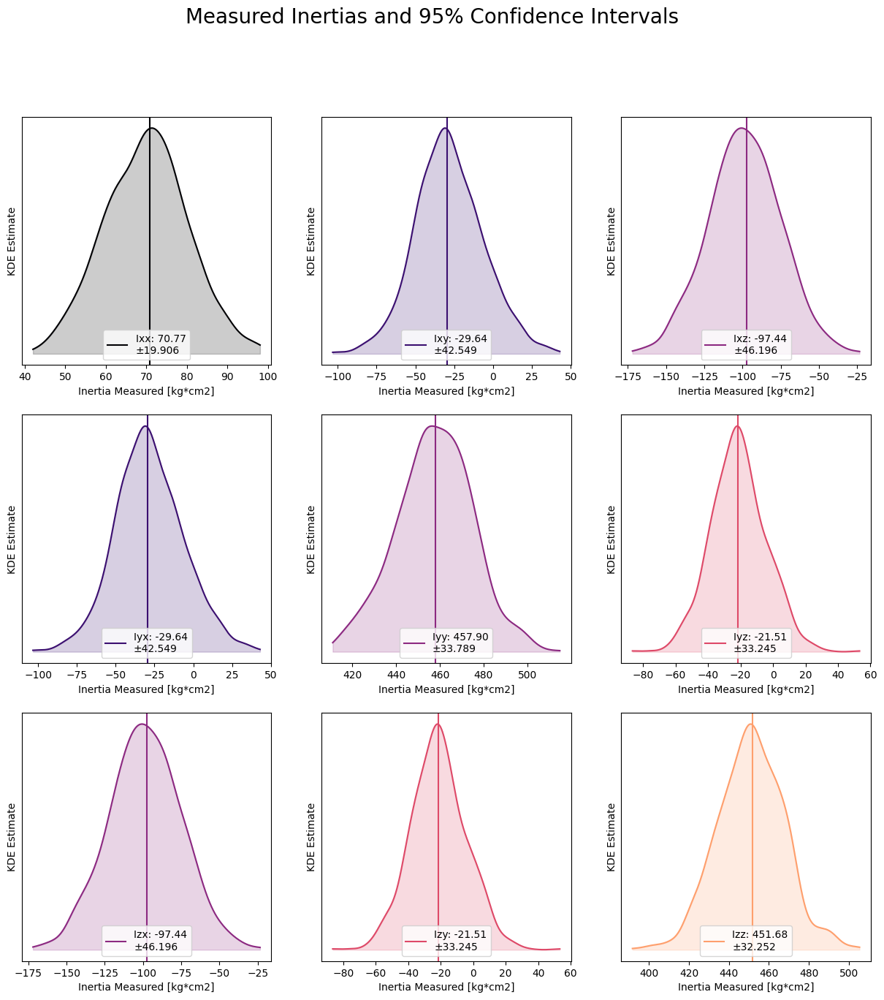

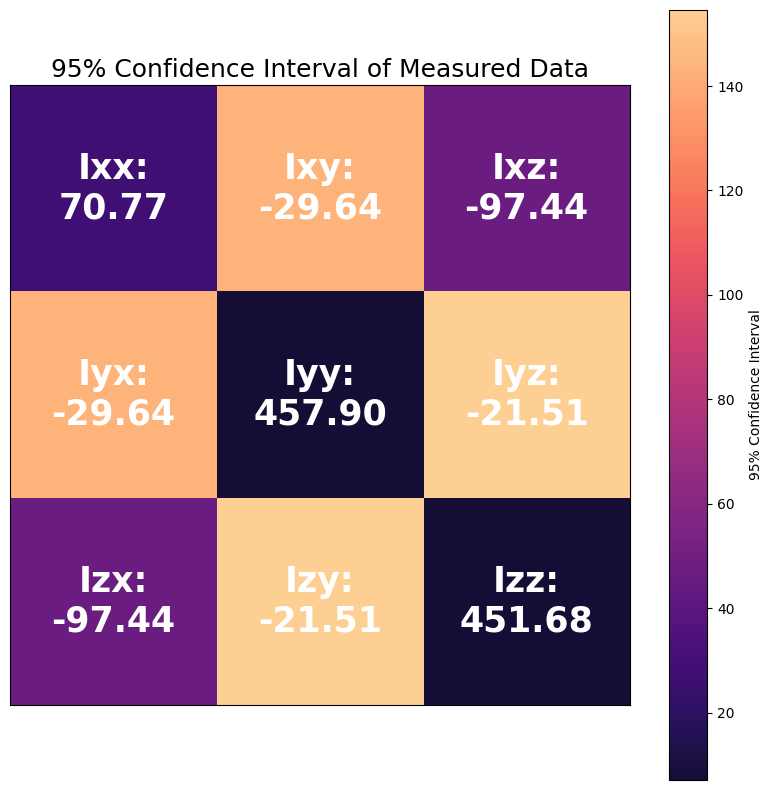

In [24]:
fig, axs = plt.subplots(3,3,figsize=(15,15))
fig2,ax2 = plt.subplots(figsize=(10,10))
confidenceIntervals = np.zeros((3,3))
I_names_official = np.array([['Ixx','Ixy','Ixz'],['Iyx','Iyy','Iyz'],['Izx','Izy','Izz']])
# Define the number of iterations
num_iterations = 9

# Create evenly spaced indices for selecting colors
color_indices = np.linspace(0, 0.8, num_iterations)

# Create a colormap object
cmap = plt.get_cmap('magma')

# Define a list to store colors
colors = []

# Select colors from the 'magma' colormap with varying intensities
for index in color_indices:
    colors.append(cmap(index))

# Assuming axs is already defined somewhere in your code
for i in range(3):
    for j in range(3):
        # print(error['Pre-Tensor Average'].shape)
        meanv = np.mean(I_solved[i,j])
        minv = np.min(I_solved_simulated[i,j,:])
        maxv = np.max(I_solved_simulated[i,j,:])
        xi = np.linspace(minv,maxv,1000)
        kde = gaussian_kde(I_solved_simulated[i,j,:])
        color = colors[(i + j)*2]  # Select color from the list
        axs[i][j].plot(xi, kde(xi), linestyle='-', color=color,label='{}: {:.2f}\n±{:.3f}'.format(I_names_official[i][j],meanv,1.96*np.std(I_solved_simulated[i,j,:])))
        axs[i][j].fill_between(xi, kde(xi), alpha=0.2, color=color)
        axs[i][j].axvline(x=meanv, linestyle='-', color=color)
        axs[i][j].legend(loc='lower center')
        confidenceIntervals[i][j] = np.abs(((1.96*np.std(I_solved_simulated[i,j,:]))/meanv)*100)

for ax in axs.flat:
    ax.set(xlabel='Inertia Measured [kg*cm2]', ylabel='KDE Estimate')
    ax.tick_params(axis='y', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
fig.suptitle('Measured Inertias and 95% Confidence Intervals',fontsize=20)

subset_colors = plt.cm.magma(np.linspace(0.1,0.9,1000))
subset_cmap = ListedColormap(subset_colors)
im = ax2.imshow(confidenceIntervals,cmap=subset_cmap)
fig2.colorbar(im,ax=ax2,label='95% Confidence Interval')
ax2.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
for i in range(3):
    for j in range(3):
        text = ax2.text(j, i, '{}:\n{:.2f}'.format(I_names_official[i, j],I_solved[i,j]),
                       ha="center", va="center", color="w",fontsize=25,fontweight=600)
plt.title('95% Confidence Interval of Measured Data',fontsize=18)
    

In [ ]:
print(I_solved)

[[ 70.77096763 -29.6352394  -97.43703589]
 [-29.6352394  457.89542393 -21.50982349]
 [-97.43703589 -21.50982349 451.67766353]]
